In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import pandas as pd
import sunpy
import sunpy.map
from sunpy.coordinates import (get_earth, get_horizons_coord,
                                Helioprojective, propagate_with_solar_surface,
                                HeliocentricEarthEcliptic, get_body_heliographic_stonyhurst)
import sunkit_image
import sunkit_image.coalignment as coalignment
import astropy
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
import astropy.units as u
import astropy.constants as const
from astropy.io import fits
from astropy.time import Time
import eispac
from sjireader import read_iris_sji
import pyvista as pv
import h5py
from scipy.interpolate import LinearNDInterpolator
from scipy.io import readsav

import cmcrameri.cm as cmcm
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import (AutoLocator, AutoMinorLocator, 
    FixedLocator, FixedFormatter, LogLocator, StrMethodFormatter)
from ipywidgets import interactive, widgets
from IPython.display import display, clear_output
from astropy.visualization import (AsinhStretch, LinearStretch,
        LogStretch, ImageNormalize,PowerStretch)
import os
from sun_blinker import SunBlinker
from copy import deepcopy   


In [2]:
def coalign_shift(big_map, small_map):
    yshift, xshift = coalignment._calculate_shift(big_map.data, small_map.data)
    reference_coord = big_map.pixel_to_world(xshift, yshift)
    Txshift = reference_coord.Tx - small_map.bottom_left_coord.Tx
    Tyshift = reference_coord.Ty - small_map.bottom_left_coord.Ty

    return Txshift, Tyshift
    

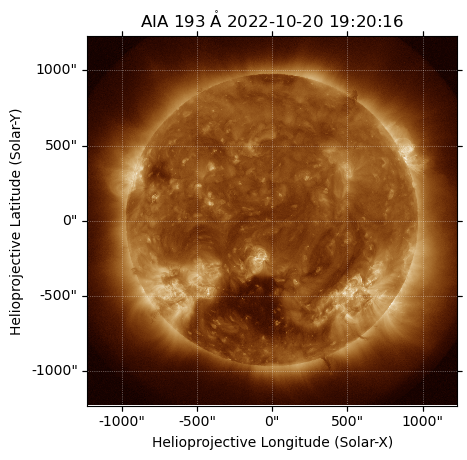

In [3]:
aia_193_map = sunpy.map.Map("../../src/AIA/20221020/193/lvl15/aia.lev1_euv_12s.2022-10-20T192015Z.193.image.fits")
aia_193_map.plot()

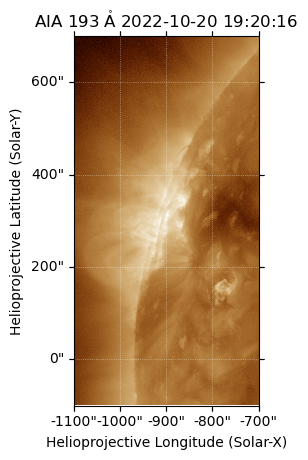

In [4]:
aia_193_map_crop = aia_193_map.submap(SkyCoord(-1100*u.arcsec,-100*u.arcsec,frame=aia_193_map.coordinate_frame),
                                        top_right=SkyCoord(-700*u.arcsec,700*u.arcsec,frame=aia_193_map.coordinate_frame))
aia_193_map_crop.plot()

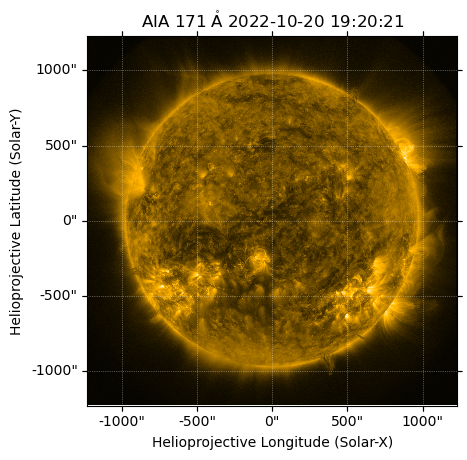

In [5]:
aia_171_map = sunpy.map.Map("../../src/AIA/20221020/171/lvl15/aia.lev1_euv_12s.2022-10-20T192027Z.171.image.fits")
aia_171_map.plot()

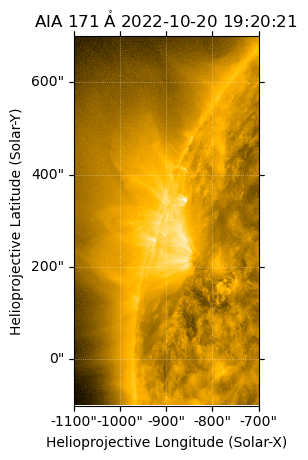

In [6]:
aia_171_map_crop = aia_171_map.submap(SkyCoord(-1100*u.arcsec,-100*u.arcsec,frame=aia_171_map.coordinate_frame),
                                        top_right=SkyCoord(-700*u.arcsec,700*u.arcsec,frame=aia_171_map.coordinate_frame))
aia_171_map_crop.plot()

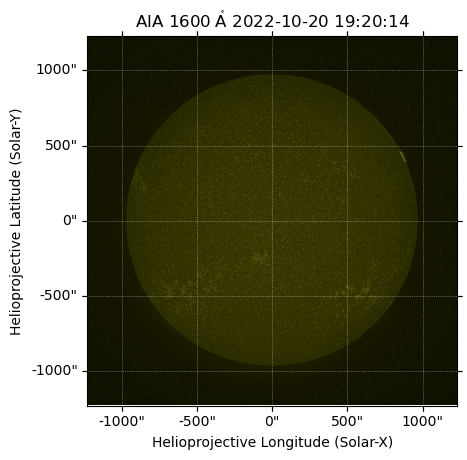

In [7]:
aia_1600_map = sunpy.map.Map("../../src/AIA/20221020/1600/lvl15/aia.lev1_uv_24s.2022-10-20T192015Z.1600.image.fits")
aia_1600_map.plot()

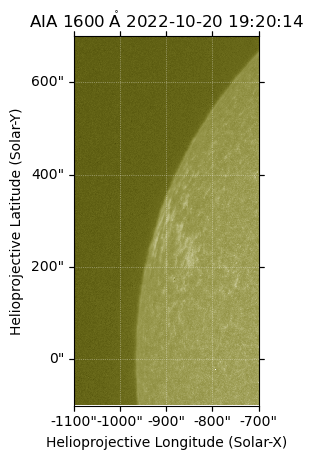

In [8]:
aia_1600_map_crop = aia_1600_map.submap(SkyCoord(-1100*u.arcsec,-100*u.arcsec,frame=aia_1600_map.coordinate_frame),
                                        top_right=SkyCoord(-700*u.arcsec,700*u.arcsec,frame=aia_1600_map.coordinate_frame))
aia_1600_map_crop.plot()

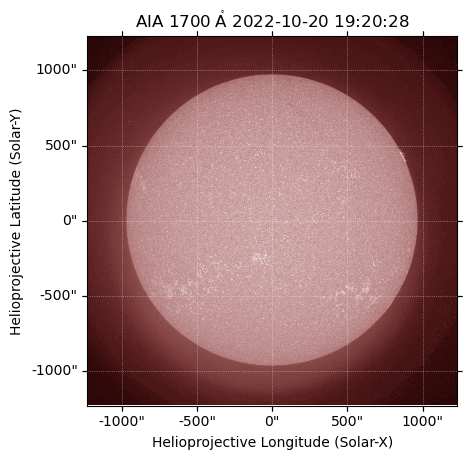

In [9]:
aia_1700_map = sunpy.map.Map("../../src/AIA/20221020/1700/lvl15/aia.lev1_uv_24s.2022-10-20T192039Z.1700.image.fits")
aia_1700_map.plot()

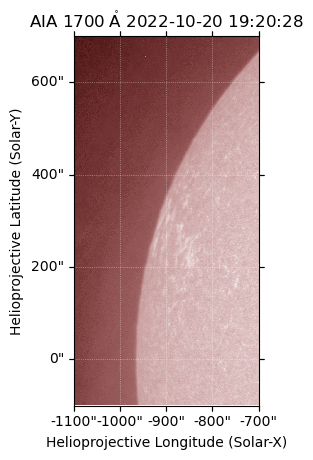

In [10]:
aia_1700_map_crop = aia_1700_map.submap(SkyCoord(-1100*u.arcsec,-100*u.arcsec,frame=aia_1700_map.coordinate_frame),
                                        top_right=SkyCoord(-700*u.arcsec,700*u.arcsec,frame=aia_1700_map.coordinate_frame))
aia_1700_map_crop.plot()

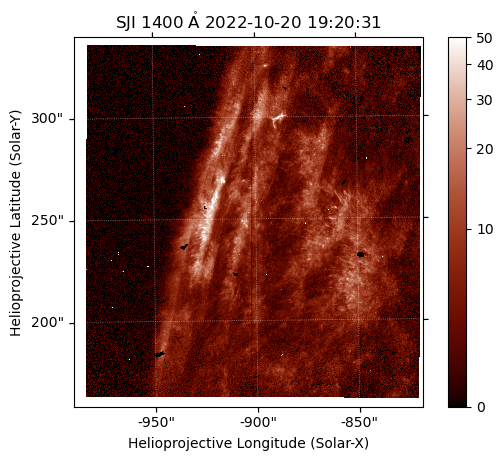

In [11]:
iris_1400_sji_map = read_iris_sji("../../src/IRIS/20221020/1905/iris_l2_20221020_190518_3640007428_SJI_1400_t000.fits",index=aia_1700_map.date,sdo_rsun=True)
iris_1400_sji_map.plot_settings['norm'] = ImageNormalize(vmin=0,vmax=50,stretch=AsinhStretch(0.1))
iris_1400_sji_map.plot()
plt.colorbar()

In [12]:
aia_304_map = sunpy.map.Map("../../src/AIA/20221020/304/lvl15/aia.lev1_euv_12s.2022-10-20T192015Z.304.image.fits",memmap=False)

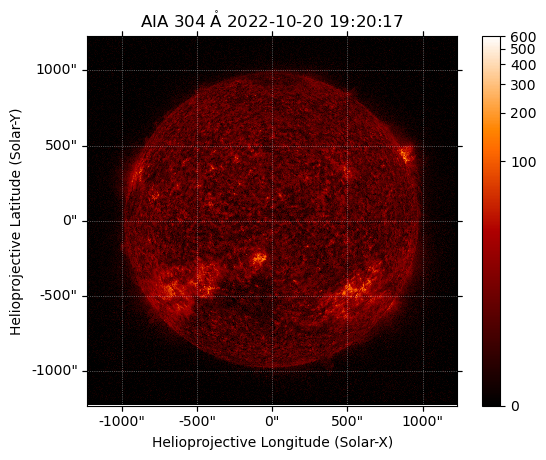

In [13]:
aia_304_map.plot(vmin=0,vmax=600)
plt.colorbar()

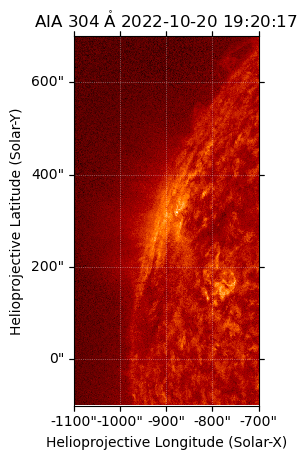

In [14]:
aia_304_map_crop = aia_304_map.submap(SkyCoord(-1100*u.arcsec,-100*u.arcsec,frame=aia_304_map.coordinate_frame),
                                        top_right=SkyCoord(-700*u.arcsec,700*u.arcsec,frame=aia_304_map.coordinate_frame))
aia_304_map_crop.plot()

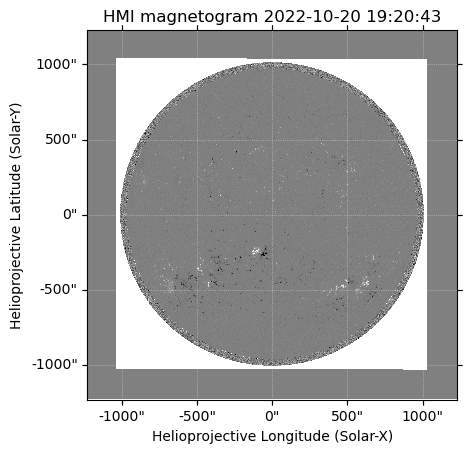

In [15]:
hmi_los_map = sunpy.map.Map("../../src/HMI/20221020/lvl15/hmi.M_45s.20221020_192145_TAI.2.magnetogram.fits")
hmi_los_map.plot_settings['norm'] = plt.Normalize(-500, 500)
hmi_los_map.plot()

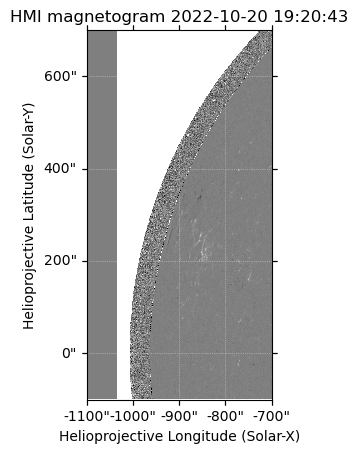

In [16]:
hmi_los_map_crop = hmi_los_map.submap(SkyCoord(-1100*u.arcsec,-100*u.arcsec,frame=hmi_los_map.coordinate_frame),
                                        top_right=SkyCoord(-700*u.arcsec,700*u.arcsec,frame=hmi_los_map.coordinate_frame))
hmi_los_map_crop.plot()

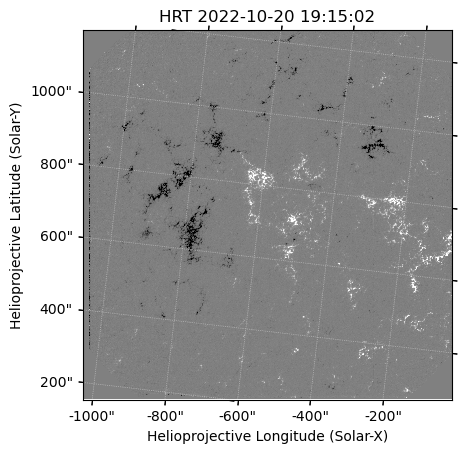

In [17]:
phi_los_map = sunpy.map.Map("../../src/PHI/20221020/solo_L2_phi-hrt-blos_20221020T191502_V01.fits")
phi_los_map.meta["rsun_ref"] = aia_1600_map.meta["rsun_ref"]
phi_los_map.plot_settings['norm'] = plt.Normalize(-500, 500)
phi_los_map.plot()

2022-10-20T19:20:26.433


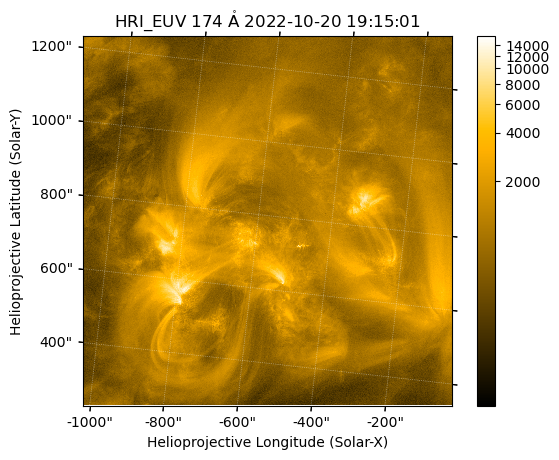

In [18]:
hri_174_map = sunpy.map.Map("../../src/EUI/HRI/euv174/20221020/solo_L2_eui-hrieuv174-image_20221020T191500198_V01.fits")
hri_174_map.meta["rsun_ref"] = aia_1600_map.meta["rsun_ref"]
print(hri_174_map.meta["date_ear"])
hri_174_map.plot()
plt.colorbar()

In [19]:
fsi_174_map = sunpy.map.Map("../../src/EUI/FSI/euv174/20221020/solo_L2_eui-fsi174-image_20221020T192050198_V01.fits")
fsi_174_map.meta["rsun_ref"] = aia_193_map.meta["rsun_ref"]
fsi_304_map = sunpy.map.Map("../../src/EUI/FSI/euv304/20221020/solo_L2_eui-fsi304-image_20221020T192020198_V01.fits")
fsi_304_map.meta["rsun_ref"] = aia_193_map.meta["rsun_ref"]

In [20]:
def derotate_fsi(fsi_map, hri_map,algorithm="adaptive"):
    out_frame = hri_map.coordinate_frame
    out_center = SkyCoord(0*u.arcsec, 0*u.arcsec, frame=out_frame)
    header = sunpy.map.make_fitswcs_header(fsi_map.data.shape,
                                        out_center,
                                        scale=u.Quantity(fsi_map.scale),
                                        rotation_matrix=hri_map.rotation_matrix) 
    # correct the tiny rotation matrix difference between FSI and HRI, which simply the coalignment
    out_wcs = WCS(header)

    with propagate_with_solar_surface():
        fsi_map_derot = fsi_map.reproject_to(out_wcs,algorithm=algorithm)

    return fsi_map_derot


In [21]:
fsi_174_map_hri_time = derotate_fsi(fsi_174_map,hri_174_map)

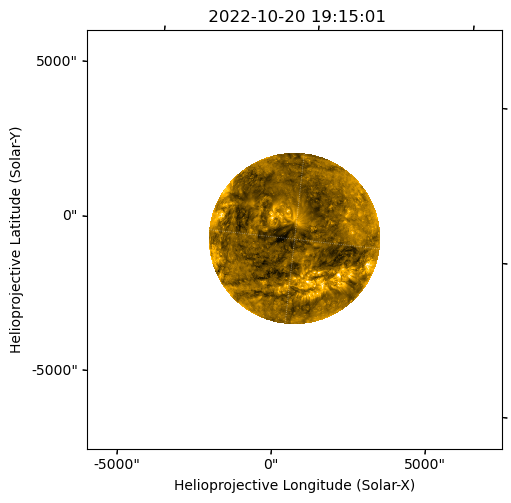

In [22]:
fig = plt.figure(figsize=(5,5),constrained_layout=True)

ax1 = fig.add_subplot(111,projection=fsi_174_map_hri_time)
fsi_174_map_hri_time.plot()

In [23]:
fsi_174_crop = fsi_174_map_hri_time.submap(SkyCoord(-1200*u.arcsec,100*u.arcsec,frame=fsi_174_map_hri_time.coordinate_frame),
                                        top_right=SkyCoord(200*u.arcsec,1300*u.arcsec,frame=fsi_174_map_hri_time.coordinate_frame))

In [24]:
hri_174_map_repro = hri_174_map.reproject_to(fsi_174_crop.wcs)

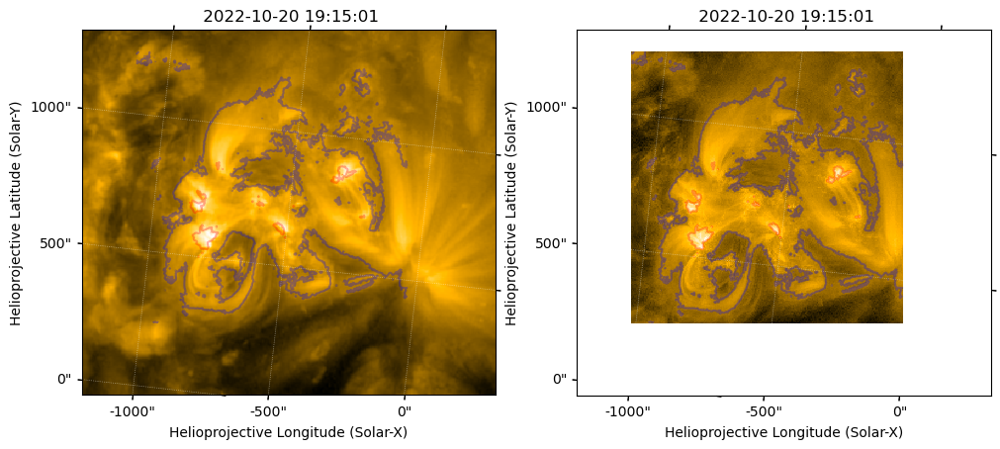

In [25]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_crop)
im1 = fsi_174_crop.plot()

ax2 = fig.add_subplot(122,projection=hri_174_map_repro)
im2 = hri_174_map_repro.plot()

hri_levels = [1000,5000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_repro.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


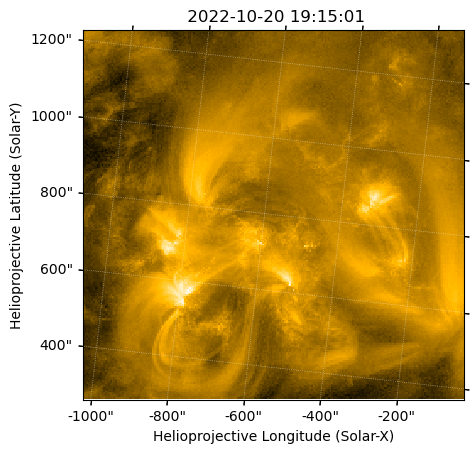

In [26]:
hri_174_map_repro_cut = hri_174_map_repro.submap([45,67]*u.pix,
                                                 top_right=[270,285]*u.pix)
hri_174_map_repro_cut.plot()

In [94]:
Txshift_hri, Tyshift_hri = coalign_shift(fsi_174_crop,hri_174_map_repro_cut)
print(Txshift_hri, Tyshift_hri)

9.41462 arcsec 7.05089 arcsec


In [28]:
hri_174_map_repro_shift = hri_174_map_repro.shift_reference_coord(Txshift_hri,Tyshift_hri)
hri_174_map_repro_cut_shift = hri_174_map_repro_cut.shift_reference_coord(Txshift_hri,Tyshift_hri)
hri_174_map_shifted = hri_174_map.shift_reference_coord(Txshift_hri,Tyshift_hri)
# hri_174_map_shifted = hri_174_map_shifted.submap([10,10]*u.pix,
#                                                     top_right=[2038,2038]*u.pix)
fsi_174_hri_fov = fsi_174_map_hri_time.reproject_to(hri_174_map_shifted.wcs)

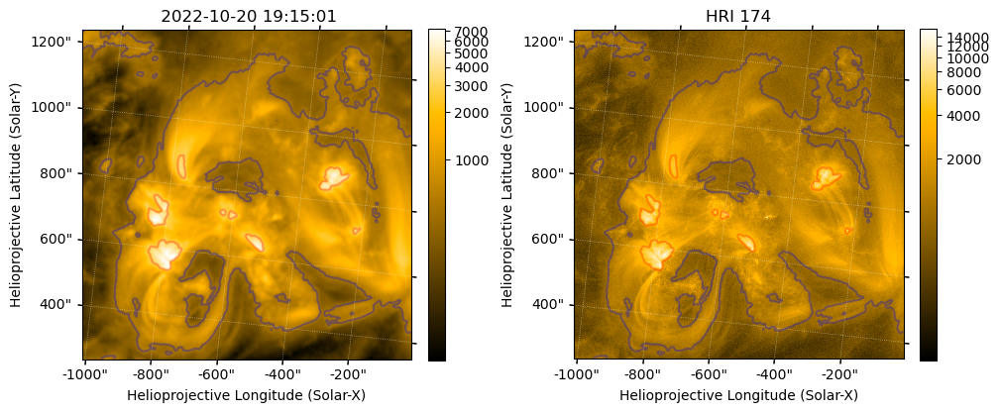

In [29]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_hri_fov)
im1 = fsi_174_hri_fov.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()
ax2.set_title("HRI 174")
plt.colorbar(ax=ax2,shrink=0.75)

fsi_174_levels = [500,3000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_174_hri_fov.draw_contours(fsi_174_levels,colors=["b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)

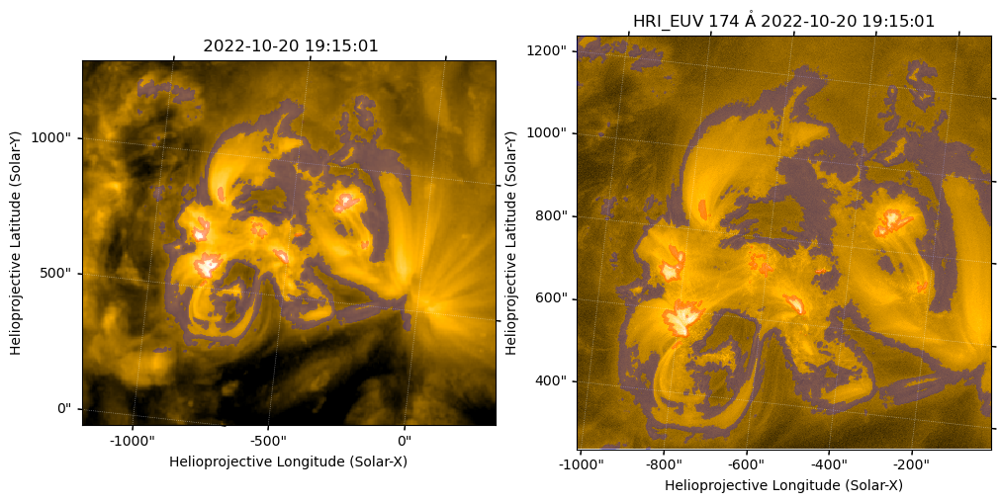

In [96]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=fsi_174_crop)
im1 = fsi_174_crop.plot()

ax2 = fig.add_subplot(122,projection=hri_174_map_shifted)
im2 = hri_174_map_shifted.plot()

hri_levels = [1000,5000]*hri_174_map_shifted.unit

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    hri_174_map_shifted.draw_contours(hri_levels,colors=["b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


In [30]:
SunBlinker(fsi_174_hri_fov, hri_174_map_shifted,figsize=(6,6))

In [31]:
fsi_304_map_hri_time = derotate_fsi(fsi_304_map,hri_174_map)

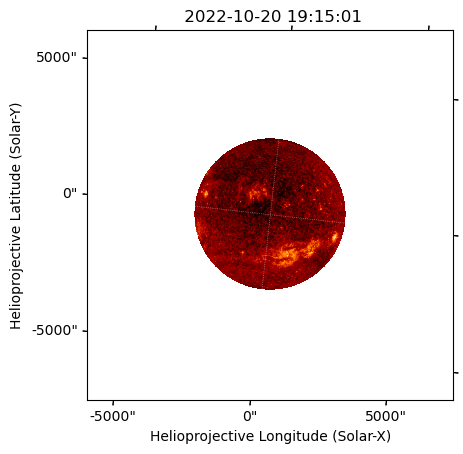

In [32]:
fsi_304_map_hri_time.plot()

In [33]:
SunBlinker(fsi_174_crop, fsi_304_map_hri_time, reproject=True)

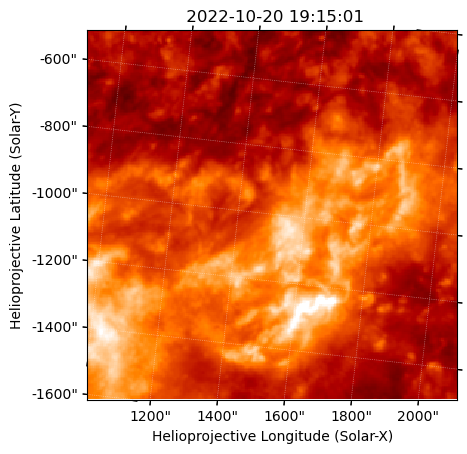

In [34]:
fsi_304_crop = fsi_304_map_hri_time.submap(SkyCoord(1000*u.arcsec,-1500*u.arcsec,frame=fsi_304_map_hri_time.coordinate_frame),
                                    top_right=SkyCoord(2000*u.arcsec,-500*u.arcsec,frame=fsi_304_map_hri_time.coordinate_frame))
fsi_304_crop.plot()

In [35]:
aia_304_map_repro = aia_304_map.reproject_to(fsi_304_crop.wcs)

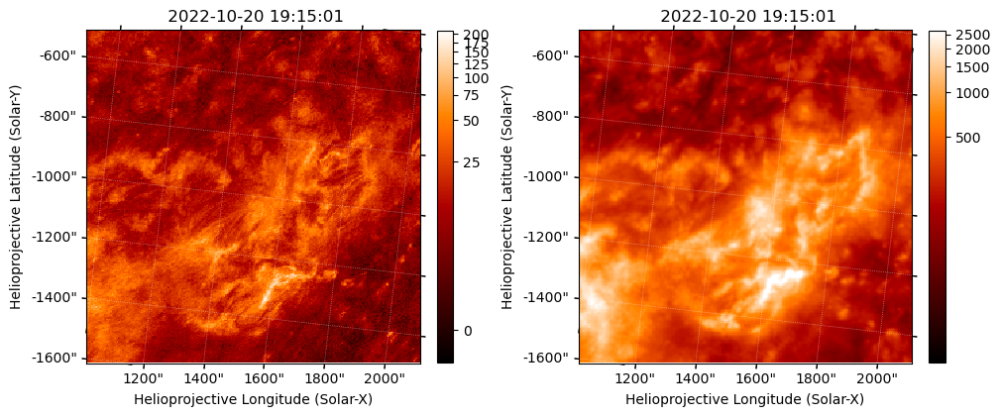

In [36]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_304_map_repro)
im1 = aia_304_map_repro.plot()
plt.colorbar(ax=ax1,shrink=0.75)

ax2 = fig.add_subplot(122,projection=fsi_304_crop)
im2 = fsi_304_crop.plot()
plt.colorbar(ax=ax2,shrink=0.75)

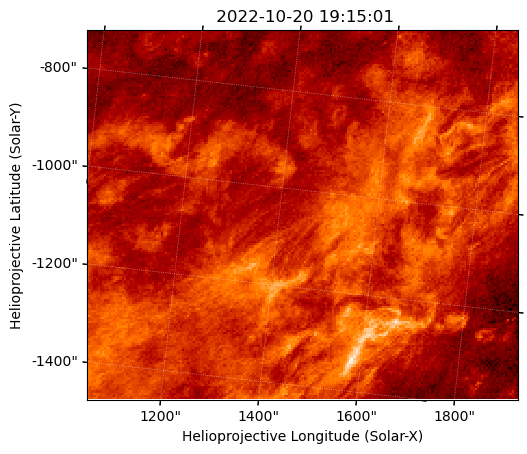

In [37]:
aia_304_map_repro_cut = aia_304_map_repro.submap([12,30]*u.pix,
                                                    top_right=[210,200]*u.pix)
aia_304_map_repro_cut.plot()

In [38]:
Txshift_aia_fsi, Tyshift_aia_fsi = coalign_shift(fsi_304_crop,aia_304_map_repro_cut)
print(Txshift_aia_fsi, Tyshift_aia_fsi)

20.8515 arcsec 8.29747 arcsec


In [39]:
fsi_304_crop_shift = fsi_304_crop.shift_reference_coord(-Txshift_aia_fsi,-Tyshift_aia_fsi)
fsi_174_crop_shift = fsi_174_crop.shift_reference_coord(-Txshift_aia_fsi,-Tyshift_aia_fsi)
hri_174_map_shifted_toaia = hri_174_map_shifted.shift_reference_coord(-Txshift_aia_fsi,-Tyshift_aia_fsi)
fsi_304_map_hri_time_shift = fsi_304_map_hri_time.shift_reference_coord(-Txshift_aia_fsi,-Tyshift_aia_fsi)
fsi_174_map_hri_time_shift = fsi_174_map_hri_time.shift_reference_coord(-Txshift_aia_fsi,-Tyshift_aia_fsi)

In [40]:
SunBlinker(fsi_304_crop, aia_304_map, reproject=True)

In [41]:
SunBlinker(fsi_304_crop_shift, aia_304_map, reproject=True)

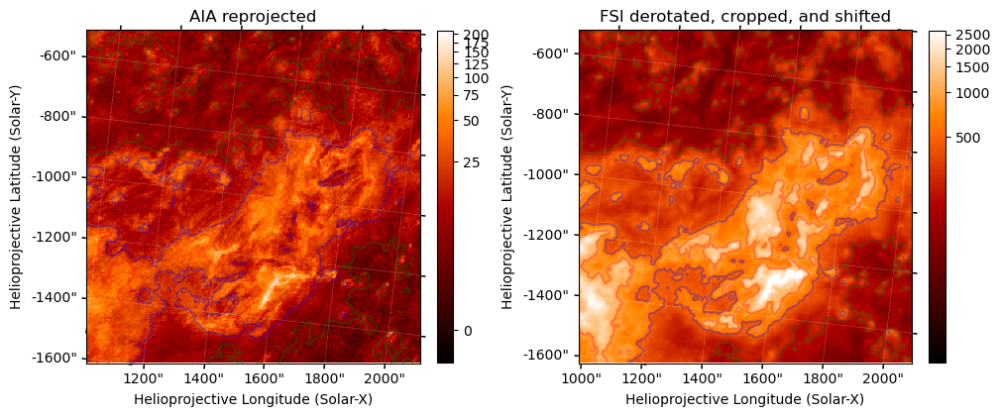

In [42]:
fig = plt.figure(figsize=(10,5),constrained_layout=True)

ax1 = fig.add_subplot(121,projection=aia_304_map_repro)
im1 = aia_304_map_repro.plot()
plt.colorbar(ax=ax1,shrink=0.75)
ax1.set_title("AIA reprojected")

ax2 = fig.add_subplot(122,projection=fsi_304_crop_shift)
im2 = fsi_304_crop_shift.plot()
plt.colorbar(ax=ax2,shrink=0.75)
ax2.set_title("FSI derotated, cropped, and shifted")

fsi_304_levels = [200,500,1000]

for ax_ in (ax1,ax2):
    bounds = ax_.axis()
    fsi_304_crop_shift.draw_contours(fsi_304_levels,colors=["g","b","r"], axes=ax_, alpha=0.3)
    ax_.axis(bounds)


In [43]:
aia_171_repro_hrifov = aia_171_map.reproject_to(hri_174_map_shifted_toaia.wcs)

In [44]:
SunBlinker(aia_171_repro_hrifov, hri_174_map_shifted_toaia)

In [45]:
# 
def reproject_to_above_surface(map,target_wcs,radius=None,height=None):
    if radius is None and height is not None:
        rsun_ref = map.meta["rsun_ref"] + height.to_value(u.m)
    elif radius is not None and height is None:
        rsun_ref = radius.to_value(u.m)
    else:
        rsun_ref = map.meta["rsun_ref"]

    map_new = deepcopy(map)
    target_wcs_new = deepcopy(target_wcs)

    map_new.meta["rsun_ref"] = rsun_ref
    target_wcs_new.wcs.aux.rsun_ref = rsun_ref

    return map_new.reproject_to(target_wcs_new)

In [46]:
aia_171_repro_hrifov_2dot8 = reproject_to_above_surface(aia_171_map,hri_174_map_shifted_toaia.wcs,height=2.8*u.Mm)

In [47]:
SunBlinker(aia_171_repro_hrifov_2dot8, hri_174_map_shifted_toaia)

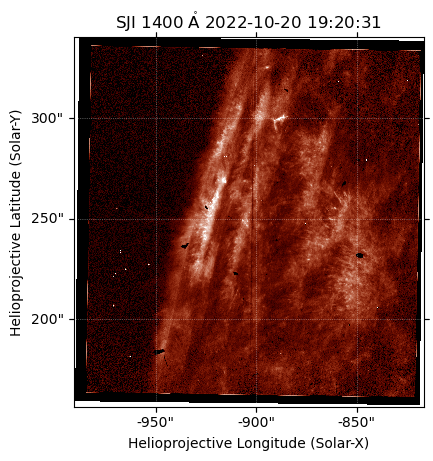

In [48]:
iris_1400_sji_map_rotate = iris_1400_sji_map.rotate()
iris_1400_sji_map_rotate.plot()

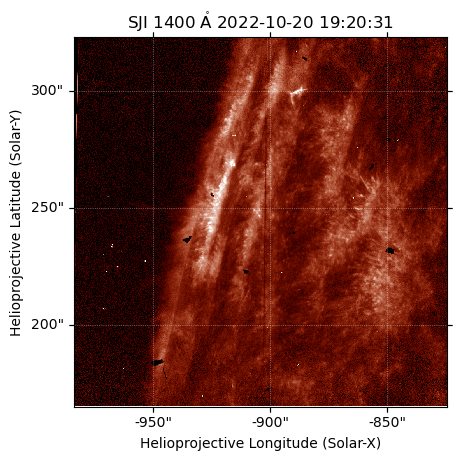

In [49]:
iris_1400_sji_map_rotate_crop = iris_1400_sji_map_rotate.submap([40,50]*u.pix,top_right=[1000,1000]*u.pix)
iris_1400_sji_map_rotate_crop.plot()

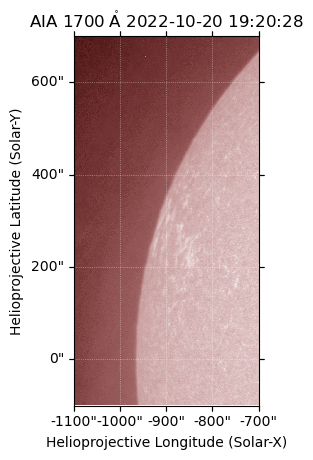

In [50]:
aia_1700_map_crop.plot()

In [51]:
iris_1400_resample_nx = (iris_1400_sji_map_rotate_crop.scale.axis1 * iris_1400_sji_map_rotate_crop.dimensions.x).to(u.arcsec) / aia_1700_map_crop.scale.axis1
iris_1400_resample_ny = (iris_1400_sji_map_rotate_crop.scale.axis2 * iris_1400_sji_map_rotate_crop.dimensions.y).to(u.arcsec) / aia_1700_map_crop.scale.axis2
iris_1400_sji_map_rotate_crop_resample = iris_1400_sji_map_rotate_crop.resample(u.Quantity([iris_1400_resample_nx, iris_1400_resample_ny]))

In [52]:
Txshift_iris_aia, Tyshift_iris_aia = coalign_shift(aia_1700_map_crop,iris_1400_sji_map_rotate_crop_resample)
print(Txshift_iris_aia, Tyshift_iris_aia)

-0.0575907 arcsec 0.0447044 arcsec


In [53]:
iris_1400_sji_map_rotate_crop_shift = iris_1400_sji_map_rotate_crop.shift_reference_coord(Txshift_iris_aia,Tyshift_iris_aia)
aia_1700_map_crop_iris_1400_fov = aia_1700_map_crop.reproject_to(iris_1400_sji_map_rotate_crop_shift.wcs)

In [54]:
SunBlinker(aia_1700_map_crop_iris_1400_fov, iris_1400_sji_map_rotate_crop_shift)

In [88]:
SunBlinker(aia_1700_map_crop_iris_1400_fov, aia_171_map_crop, reproject=True,
           norm2=ImageNormalize(stretch=AsinhStretch(0.2)))

In [55]:
eis_195_intmap_shift = sunpy.map.Map("../../src/EIS/DHB_007_v2/20221020T2343/sunpymaps/eis_195_intmap_shift.fits")

eis_195_intmap_shift.plot_settings['norm'] = ImageNormalize(stretch=AsinhStretch())
eis_195_intmap_shift.plot_settings['aspect'] = eis_195_intmap_shift.scale.axis2/eis_195_intmap_shift.scale.axis1
eis_195_intmap_shift.plot_settings['cmap'] = 'Blues_r'

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,dsun_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,crlt_obs,dsun_obs
 [sunpy.map.mapbase]


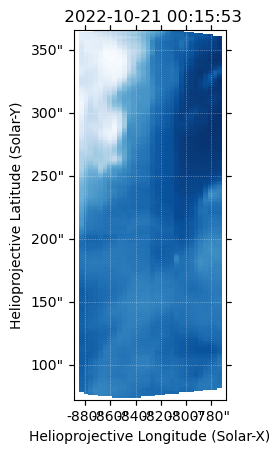

In [56]:
eis_195_intmap_shift.plot()

In [59]:
eis_195_velmap_shift = sunpy.map.Map("../../src/EIS/DHB_007_v2/20221020T2343/sunpymaps/eis_195_velmap_shift.fits")
eis_195_velmap_shift.plot_settings['aspect'] = eis_195_velmap_shift.scale.axis2/eis_195_velmap_shift.scale.axis1
eis_195_velmap_shift.plot_settings['norm'] = ImageNormalize(vmin=-20,vmax=20)
eis_195_velmap_shift.plot_settings['cmap'] = 'RdBu_r'

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,dsun_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crln_obs,crlt_obs,dsun_obs
 [sunpy.map.mapbase]


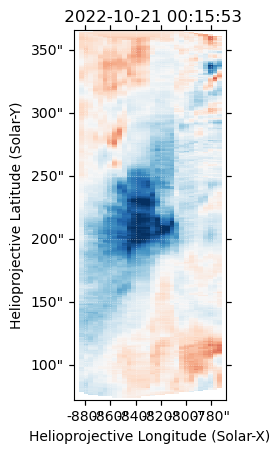

In [60]:
eis_195_velmap_shift.plot()

(-0.5, 1046.5, -0.5, 1104.5)

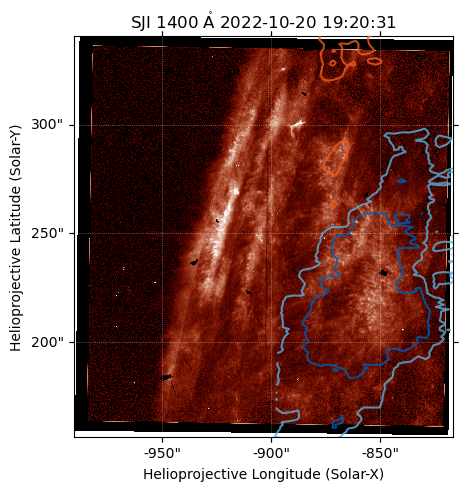

In [63]:
fig = plt.figure(layout='constrained')
ax = fig.add_subplot(projection=iris_1400_sji_map_rotate)

iris_1400_sji_map_rotate.plot(axes=ax)

bounds = ax.axis()
with propagate_with_solar_surface(rotation_model='rigid'):
    eis_195_velmap_shift.draw_contours(levels=[-10,-5,5,10],
                                       colors=["#005CAF","#58B2DC","#F05E1C","#E83015"],axes=ax,alpha=0.8)
ax.axis(bounds)

In [64]:
SunBlinker(iris_1400_sji_map_rotate_crop_shift,aia_193_map_crop,reproject=True)

In [97]:
SunBlinker(iris_1400_sji_map_rotate_crop_shift,aia_171_map_crop,reproject=True,
           norm2=ImageNormalize(stretch=AsinhStretch(0.2)),fps=1,save_fname="../../figs/test_figs/aia_171_iris_1400_1020.gif")

In [82]:
hri_174_map_shifted_toaia_repro_to_iris_2dot8 = reproject_to_above_surface(hri_174_map_shifted_toaia,
                                                                           iris_1400_sji_map_rotate_crop_shift.wcs,height=2.8*u.Mm)

In [77]:
SunBlinker(iris_1400_sji_map_rotate_crop_shift,hri_174_map_shifted_toaia,reproject=True)

In [83]:
SunBlinker(iris_1400_sji_map_rotate_crop_shift,hri_174_map_shifted_toaia_repro_to_iris_2dot8)

In [86]:
SunBlinker(hri_174_map_shifted_toaia.reproject_to(iris_1400_sji_map_rotate_crop_shift.wcs),
           hri_174_map_shifted_toaia_repro_to_iris_2dot8)